# EV Population Dataset

https://www.kaggle.com/datasets/adarshde/electric-vehicle-population-dataset?resource=download

source .venv/bin/activate

Import libraries

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import cufflinks as cf

In [6]:
df = pd.read_csv('Electric_Vehicle_Population_Data.csv')

In [7]:
df.head()

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract
0,5YJSA1E22K,King,Seattle,WA,98112.0,2019,TESLA,MODEL S,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,270,0,43.0,202233958,POINT (-122.300312 47.629782),CITY OF SEATTLE - (WA)|CITY OF TACOMA - (WA),5.303301e+10
1,3MW39FS05R,Yakima,Zillah,WA,98953.0,2024,BMW,330E,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,20,0,15.0,264425178,POINT (-120.2658133 46.4063477),PACIFICORP,5.307700e+10
2,1N4AZ0CP0F,King,Kent,WA,98031.0,2015,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,84,0,11.0,114962025,POINT (-122.201564 47.402358),PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),5.303303e+10
3,5YJSA1H20F,Snohomish,Bothell,WA,98012.0,2015,TESLA,MODEL S,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,208,0,1.0,232724670,POINT (-122.206146 47.839957),PUGET SOUND ENERGY INC,5.306105e+10
4,JTMAB3FV1N,Yakima,Yakima,WA,98908.0,2022,TOYOTA,RAV4 PRIME,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,42,0,14.0,221023589,POINT (-120.611068 46.596645),PACIFICORP,5.307700e+10


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 191407 entries, 0 to 191406
Data columns (total 17 columns):
 #   Column                                             Non-Null Count   Dtype  
---  ------                                             --------------   -----  
 0   VIN (1-10)                                         191407 non-null  object 
 1   County                                             191403 non-null  object 
 2   City                                               191403 non-null  object 
 3   State                                              191407 non-null  object 
 4   Postal Code                                        191403 non-null  float64
 5   Model Year                                         191407 non-null  int64  
 6   Make                                               191407 non-null  object 
 7   Model                                              191407 non-null  object 
 8   Electric Vehicle Type                              191407 non-null  object

In [9]:
df.describe()

,Postal Code,Model Year,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,2020 Census Tract
count,191403.000000,191407.000000,191407.000000,191407.000000,190993.000000,1.914070e+05,1.914030e+05
mean,98177.823603,2020.732335,55.657442,994.773258,29.016880,2.237202e+08,5.297759e+10
std,2392.808886,2.990487,90.151930,8050.523372,14.909417,7.398058e+07,1.573588e+09
min,1731.000000,1997.000000,0.000000,0.000000,1.000000,4.385000e+03,1.001020e+09
25%,98052.000000,2019.000000,0.000000,0.000000,17.000000,1.861622e+08,5.303301e+10
50%,98125.000000,2022.000000,0.000000,0.000000,33.000000,2.328176e+08,5.303303e+10
75%,98371.000000,2023.000000,72.000000,0.000000,42.000000,2.589708e+08,5.305307e+10
max,99577.000000,2025.000000,337.000000,845000.000000,49.000000,4.792548e+08,5.602100e+10


<Axes: >

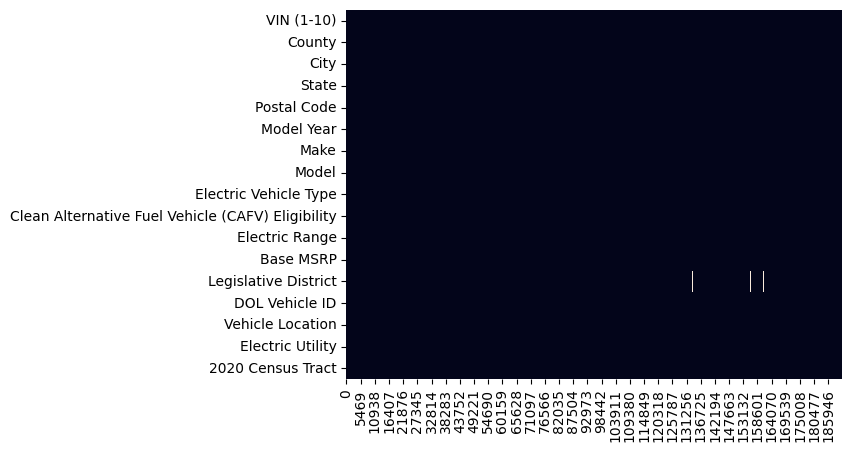

In [10]:
sns.heatmap(df.isna().transpose(), cbar=False) # View any columns with empty values

In [11]:
df.dropna(inplace=True) # Dropped around 400 rows

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 190989 entries, 0 to 191406
Data columns (total 17 columns):
 #   Column                                             Non-Null Count   Dtype  
---  ------                                             --------------   -----  
 0   VIN (1-10)                                         190989 non-null  object 
 1   County                                             190989 non-null  object 
 2   City                                               190989 non-null  object 
 3   State                                              190989 non-null  object 
 4   Postal Code                                        190989 non-null  float64
 5   Model Year                                         190989 non-null  int64  
 6   Make                                               190989 non-null  object 
 7   Model                                              190989 non-null  object 
 8   Electric Vehicle Type                              190989 non-null  object 
 9 

In [13]:
df.isna().sum()

VIN (1-10)                                           0
County                                               0
City                                                 0
State                                                0
Postal Code                                          0
Model Year                                           0
Make                                                 0
Model                                                0
Electric Vehicle Type                                0
Clean Alternative Fuel Vehicle (CAFV) Eligibility    0
Electric Range                                       0
Base MSRP                                            0
Legislative District                                 0
DOL Vehicle ID                                       0
Vehicle Location                                     0
Electric Utility                                     0
2020 Census Tract                                    0
dtype: int64

<Axes: >

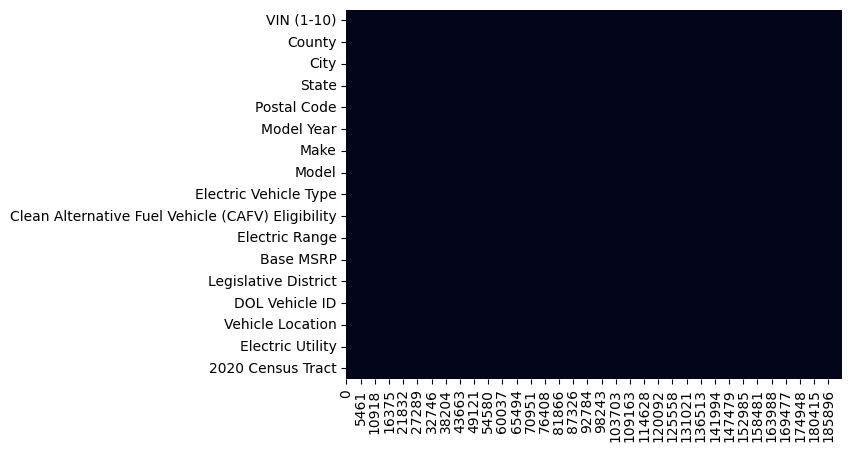

In [14]:
sns.heatmap(df.isna().transpose(), cbar=False) # Confirm columns with empty values are gone

Average Electric Range

In [15]:
avg_range = df['Electric Range'].mean()
avg_range

np.float64(55.63033473131961)

Location of vehicle with Vehicle ID 221023589

In [16]:
location = df[df['DOL Vehicle ID'] == 221023589]['Vehicle Location']
location

4    POINT (-120.611068 46.596645)
Name: Vehicle Location, dtype: object

Number of unique Models

In [17]:
num_models = df['Model'].nunique()
num_models

147

Top 5 most common models

In [18]:
popular_models = df['Model'].value_counts().head(5)
popular_models

Model
MODEL Y    39443
MODEL 3    30884
LEAF       13425
MODEL S     7848
BOLT EV     6433
Name: count, dtype: int64

Number of cars that are BEVs

In [19]:
BEVs = df['Electric Vehicle Type'].apply(lambda x: x.lower())
BEVs = BEVs.str.contains('bev').sum()
BEVs

np.int64(149395)

Total number of Tesla vehicles

In [20]:
Tesla = df[df['Make'] == 'TESLA'].count()
Tesla

VIN (1-10)                                           84464
County                                               84464
City                                                 84464
State                                                84464
Postal Code                                          84464
Model Year                                           84464
Make                                                 84464
Model                                                84464
Electric Vehicle Type                                84464
Clean Alternative Fuel Vehicle (CAFV) Eligibility    84464
Electric Range                                       84464
Base MSRP                                            84464
Legislative District                                 84464
DOL Vehicle ID                                       84464
Vehicle Location                                     84464
Electric Utility                                     84464
2020 Census Tract                                    844

Number of BMWs in Seattle

In [21]:
BMW_Seattle = df[(df['Make'] == 'BMW') & (df['City'] == 'Seattle')].count()
BMW_Seattle

VIN (1-10)                                           1691
County                                               1691
City                                                 1691
State                                                1691
Postal Code                                          1691
Model Year                                           1691
Make                                                 1691
Model                                                1691
Electric Vehicle Type                                1691
Clean Alternative Fuel Vehicle (CAFV) Eligibility    1691
Electric Range                                       1691
Base MSRP                                            1691
Legislative District                                 1691
DOL Vehicle ID                                       1691
Vehicle Location                                     1691
Electric Utility                                     1691
2020 Census Tract                                    1691
dtype: int64

In [22]:
import plotly.express as px
# https://plotly.com/python/getting-started/

Identifying proportion of vehicles eligible for clean alternative fuel

In [23]:
fig = px.histogram(df, x='Electric Vehicle Type', color='Clean Alternative Fuel Vehicle (CAFV) Eligibility')
fig.show()

Identifying proportion of BEVs and PHEVs

In [24]:
fig = px.histogram(df, x='Model Year', color='Electric Vehicle Type')
fig.show()

Identifying which vehicle makes are the most popular in Washington

In [52]:
popular_makes = df['Make'].value_counts().head(5).to_frame().reset_index() 
# Take the top 5 Makes as a series, convert to df and reset index
fig = px.bar(popular_makes, x='Make', y='count', color='Make')
fig.show()

Identifying the Counties with the largest numbers of EVs

In [51]:
County = df.groupby('County').count().sort_values(by='City', ascending=False)['City'].index # Take the County name
County_values = df.groupby('County').count().sort_values(by='City', ascending=False)['City'].values # Take the value
fig = px.bar(x=County[0:9], y=County_values[0:9], color=County_values[0:9], color_continuous_scale=px.colors.sequential.Peach)
# Take the first 10 Counties
fig.show()
# To do: add axes names